In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

In [2]:
train_data = pd.read_csv("train.csv")

C:\Users\HP\AppData\Local\Temp\ipykernel_2408\2026531262.py:1: DtypeWarning: Columns (26) have mixed types. Specify dtype option on import or set low_memory=False.
  train_data = pd.read_csv("train.csv")


In [3]:
train_data

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,0x1602,CUS_0xd40,January,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,_,809.98,26.822620,22 Years and 1 Months,No,49.574949,80.41529543900253,High_spent_Small_value_payments,312.49408867943663,Good
1,0x1603,CUS_0xd40,February,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.944960,NaN,No,49.574949,118.28022162236736,Low_spent_Large_value_payments,284.62916249607184,Good
2,0x1604,CUS_0xd40,March,Aaron Maashoh,-500,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,28.609352,22 Years and 3 Months,No,49.574949,81.699521264648,Low_spent_Medium_value_payments,331.2098628537912,Good
3,0x1605,CUS_0xd40,April,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,NaN,3,...,Good,809.98,31.377862,22 Years and 4 Months,No,49.574949,199.4580743910713,Low_spent_Small_value_payments,223.45130972736786,Good
4,0x1606,CUS_0xd40,May,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,1824.843333,3,...,Good,809.98,24.797347,22 Years and 5 Months,No,49.574949,41.420153086217326,High_spent_Medium_value_payments,341.48923103222177,Good
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,0x25fe9,CUS_0x942c,April,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,...,_,502.38,34.663572,31 Years and 6 Months,No,35.104023,60.97133255718485,High_spent_Large_value_payments,479.866228,Poor
99996,0x25fea,CUS_0x942c,May,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,...,_,502.38,40.565631,31 Years and 7 Months,No,35.104023,54.18595028760385,High_spent_Medium_value_payments,496.65161,Poor
99997,0x25feb,CUS_0x942c,June,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,...,Good,502.38,41.255522,31 Years and 8 Months,No,35.104023,24.02847744864441,High_spent_Large_value_payments,516.809083,Poor
99998,0x25fec,CUS_0x942c,July,Nicks,25,078-73-5990,Mechanic,39628.99,3359.415833,4,...,Good,502.38,33.638208,31 Years and 9 Months,No,35.104023,251.67258219721603,Low_spent_Large_value_payments,319.164979,Standard


In [4]:
ctrain_data = train_data.copy()

In [5]:
ctrain_data.info() # Multiple columns which should have been float datatype are stored as object type

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 28 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   ID                        100000 non-null  object 
 1   Customer_ID               100000 non-null  object 
 2   Month                     100000 non-null  object 
 3   Name                      90015 non-null   object 
 4   Age                       100000 non-null  object 
 5   SSN                       100000 non-null  object 
 6   Occupation                100000 non-null  object 
 7   Annual_Income             100000 non-null  object 
 8   Monthly_Inhand_Salary     84998 non-null   float64
 9   Num_Bank_Accounts         100000 non-null  int64  
 10  Num_Credit_Card           100000 non-null  int64  
 11  Interest_Rate             100000 non-null  int64  
 12  Num_of_Loan               100000 non-null  object 
 13  Type_of_Loan              88592 non-null   ob

In [6]:
ctrain_data.shape

(100000, 28)

#### Checking for null values

In [7]:
ctrain_data.isna().sum()

ID                              0
Customer_ID                     0
Month                           0
Name                         9985
Age                             0
SSN                             0
Occupation                      0
Annual_Income                   0
Monthly_Inhand_Salary       15002
Num_Bank_Accounts               0
Num_Credit_Card                 0
Interest_Rate                   0
Num_of_Loan                     0
Type_of_Loan                11408
Delay_from_due_date             0
Num_of_Delayed_Payment       7002
Changed_Credit_Limit            0
Num_Credit_Inquiries         1965
Credit_Mix                      0
Outstanding_Debt                0
Credit_Utilization_Ratio        0
Credit_History_Age           9030
Payment_of_Min_Amount           0
Total_EMI_per_month             0
Amount_invested_monthly      4479
Payment_Behaviour               0
Monthly_Balance              1200
Credit_Score                    0
dtype: int64

#### Checking for duplicated values

In [9]:
ctrain_data.duplicated().sum()

0

In [8]:
ctrain_data.columns

Index(['ID', 'Customer_ID', 'Month', 'Name', 'Age', 'SSN', 'Occupation',
       'Annual_Income', 'Monthly_Inhand_Salary', 'Num_Bank_Accounts',
       'Num_Credit_Card', 'Interest_Rate', 'Num_of_Loan', 'Type_of_Loan',
       'Delay_from_due_date', 'Num_of_Delayed_Payment', 'Changed_Credit_Limit',
       'Num_Credit_Inquiries', 'Credit_Mix', 'Outstanding_Debt',
       'Credit_Utilization_Ratio', 'Credit_History_Age',
       'Payment_of_Min_Amount', 'Total_EMI_per_month',
       'Amount_invested_monthly', 'Payment_Behaviour', 'Monthly_Balance',
       'Credit_Score'],
      dtype='object')

#### Finding all columns with object datatype

In [124]:
obj_cols = [c for c in ctrain_data.columns if ctrain_data[c].dtype == "object"]

In [125]:
obj_cols

['ID',
 'Customer_ID',
 'Month',
 'Name',
 'SSN',
 'Occupation',
 'Type_of_Loan',
 'Credit_Mix',
 'Credit_History_Age',
 'Payment_of_Min_Amount',
 'Payment_Behaviour',
 'Credit_Score']

In [11]:
ctrain_data[obj_cols]

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Num_of_Loan,Type_of_Loan,Num_of_Delayed_Payment,Changed_Credit_Limit,Credit_Mix,Outstanding_Debt,Credit_History_Age,Payment_of_Min_Amount,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,0x1602,CUS_0xd40,January,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",7,11.27,_,809.98,22 Years and 1 Months,No,80.41529543900253,High_spent_Small_value_payments,312.49408867943663,Good
1,0x1603,CUS_0xd40,February,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",NaN,11.27,Good,809.98,NaN,No,118.28022162236736,Low_spent_Large_value_payments,284.62916249607184,Good
2,0x1604,CUS_0xd40,March,Aaron Maashoh,-500,821-00-0265,Scientist,19114.12,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",7,_,Good,809.98,22 Years and 3 Months,No,81.699521264648,Low_spent_Medium_value_payments,331.2098628537912,Good
3,0x1605,CUS_0xd40,April,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",4,6.27,Good,809.98,22 Years and 4 Months,No,199.4580743910713,Low_spent_Small_value_payments,223.45130972736786,Good
4,0x1606,CUS_0xd40,May,Aaron Maashoh,23,821-00-0265,Scientist,19114.12,4,"Auto Loan, Credit-Builder Loan, Personal Loan,...",NaN,11.27,Good,809.98,22 Years and 5 Months,No,41.420153086217326,High_spent_Medium_value_payments,341.48923103222177,Good
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,0x25fe9,CUS_0x942c,April,Nicks,25,078-73-5990,Mechanic,39628.99,2,"Auto Loan, and Student Loan",7,11.5,_,502.38,31 Years and 6 Months,No,60.97133255718485,High_spent_Large_value_payments,479.866228,Poor
99996,0x25fea,CUS_0x942c,May,Nicks,25,078-73-5990,Mechanic,39628.99,2,"Auto Loan, and Student Loan",7,11.5,_,502.38,31 Years and 7 Months,No,54.18595028760385,High_spent_Medium_value_payments,496.65161,Poor
99997,0x25feb,CUS_0x942c,June,Nicks,25,078-73-5990,Mechanic,39628.99,2,"Auto Loan, and Student Loan",6,11.5,Good,502.38,31 Years and 8 Months,No,24.02847744864441,High_spent_Large_value_payments,516.809083,Poor
99998,0x25fec,CUS_0x942c,July,Nicks,25,078-73-5990,Mechanic,39628.99,2,"Auto Loan, and Student Loan",NaN,11.5,Good,502.38,31 Years and 9 Months,No,251.67258219721603,Low_spent_Large_value_payments,319.164979,Standard


In [12]:
ctrain_data[obj_cols].tail(20)

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Num_of_Loan,Type_of_Loan,Num_of_Delayed_Payment,Changed_Credit_Limit,Credit_Mix,Outstanding_Debt,Credit_History_Age,Payment_of_Min_Amount,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
99980,0x25fd2,CUS_0xaf61,May,Chris Wickhamm,49,133-16-7738,Writer,37188.1,3,"Home Equity Loan, Mortgage Loan, and Student Loan",12,5.38,_,620.64,30 Years and 1 Months,No,78.49772657092517,!@9#%8,396.997157,Standard
99981,0x25fd3,CUS_0xaf61,June,Chris Wickhamm,50,133-16-7738,Writer,37188.1_,3,"Home Equity Loan, Mortgage Loan, and Student Loan",12,5.38,Good,620.64,30 Years and 2 Months,NM,147.33990786653956,Low_spent_Small_value_payments,368.154976,Good
99982,0x25fd4,CUS_0xaf61,July,Chris Wickhamm,50,133-16-7738,Writer,37188.1,3,"Home Equity Loan, Mortgage Loan, and Student Loan",13,5.38,Good,620.64,30 Years and 3 Months,No,82.82557214415213,!@9#%8,412.669312,Good
99983,0x25fd5,CUS_0xaf61,August,Chris Wickhamm,50,133-16-7738,Writer,37188.1,3,"Home Equity Loan, Mortgage Loan, and Student Loan",9,5.38,_,620.64,30 Years and 4 Months,No,42.935565846112745,High_spent_Medium_value_payments,432.559318,Good
99984,0x25fda,CUS_0x8600,January,Sarah McBridec,28,031-35-0942,Architect,20002.88,5_,"Personal Loan, Auto Loan, Mortgage Loan, Stude...",26,18.31,Bad,3571.7_,5 Years and 8 Months,Yes,43.37067007268804,High_spent_Large_value_payments,328.655224,Poor
99985,0x25fdb,CUS_0x8600,February,Sarah McBridec,28,031-35-0942,Architect,20002.88,5,"Personal Loan, Auto Loan, Mortgage Loan, Stude...",25,23.31,Bad,3571.7_,5 Years and 9 Months,Yes,148.2752327451465,Low_spent_Small_value_payments,273.750662,Poor
99986,0x25fdc,CUS_0x8600,March,NaN,28,031-35-0942,Architect,20002.88,5,"Personal Loan, Auto Loan, Mortgage Loan, Stude...",25,18.31,Bad,3571.7,5 Years and 10 Months,Yes,76.28279349064607,Low_spent_Small_value_payments,345.743101,Poor
99987,0x25fdd,CUS_0x8600,April,Sarah McBridec,28_,031-35-0942,Architect,20002.88,-100,"Personal Loan, Auto Loan, Mortgage Loan, Stude...",25,18.31,_,3571.7,5 Years and 11 Months,Yes,43.72461709437765,High_spent_Large_value_payments,328.301277,Standard
99988,0x25fde,CUS_0x8600,May,Sarah McBridec,28,#F%$D@*&8,Architect,20002.88,5,"Personal Loan, Auto Loan, Mortgage Loan, Stude...",25,18.31,_,3571.7,6 Years and 0 Months,Yes,213.97800979403817,Low_spent_Small_value_payments,208.047884,Standard
99989,0x25fdf,CUS_0x8600,June,Sarah McBridec,28,031-35-0942,_______,20002.88,5,"Personal Loan, Auto Loan, Mortgage Loan, Stude...",25,16.31,Bad,3571.7,6 Years and 1 Months,Yes,74.36660309585342,!@9#%8,307.659291,Standard


#### We can see strange values in many columns, so we'll check all the unique values in each column

In [14]:
for col in obj_cols:
    print(col, ":")
    print(ctrain_data[col].unique())

ID :
['0x1602' '0x1603' '0x1604' ... '0x25feb' '0x25fec' '0x25fed']
Customer_ID :
['CUS_0xd40' 'CUS_0x21b1' 'CUS_0x2dbc' ... 'CUS_0xaf61' 'CUS_0x8600'
 'CUS_0x942c']
Month :
['January' 'February' 'March' 'April' 'May' 'June' 'July' 'August']
Name :
['Aaron Maashoh' nan 'Rick Rothackerj' ... 'Chris Wickhamm'
 'Sarah McBridec' 'Nicks']
Age :
['23' '-500' '28_' ... '4808_' '2263' '1342']
SSN :
['821-00-0265' '#F%$D@*&8' '004-07-5839' ... '133-16-7738' '031-35-0942'
 '078-73-5990']
Occupation :
['Scientist' '_______' 'Teacher' 'Engineer' 'Entrepreneur' 'Developer'
 'Lawyer' 'Media_Manager' 'Doctor' 'Journalist' 'Manager' 'Accountant'
 'Musician' 'Mechanic' 'Writer' 'Architect']
Annual_Income :
['19114.12' '34847.84' '34847.84_' ... '20002.88' '39628.99' '39628.99_']
Num_of_Loan :
['4' '1' '3' '967' '-100' '0' '0_' '2' '3_' '2_' '7' '5' '5_' '6' '8' '8_'
 '9' '9_' '4_' '7_' '1_' '1464' '6_' '622' '352' '472' '1017' '945' '146'
 '563' '341' '444' '720' '1485' '49' '737' '1106' '466' '728' '3

['80.41529543900253' '118.28022162236736' '81.699521264648' ...
 '24.02847744864441' '251.67258219721603' '167.1638651610451']
Payment_Behaviour :
['High_spent_Small_value_payments' 'Low_spent_Large_value_payments'
 'Low_spent_Medium_value_payments' 'Low_spent_Small_value_payments'
 'High_spent_Medium_value_payments' '!@9#%8'
 'High_spent_Large_value_payments']
Monthly_Balance :
['312.49408867943663' '284.62916249607184' '331.2098628537912' ...
 516.8090832742814 319.1649785257098 393.6736955618808]
Credit_Score :
['Good' 'Standard' 'Poor']


#### First we will strip "_" from all columns

In [15]:
for col in obj_cols:
    ctrain_data[col] = ctrain_data[col].str.strip('_')

#### We can see strange values like "#F%$D@*&8", "!@9#%8", so we will find all entries that contain special characters

In [19]:
for col in obj_cols:
    print(ctrain_data[ctrain_data[col].str.contains(r'[@#&$%+/*]', na = False)])

Empty DataFrame
Columns: [ID, Customer_ID, Month, Name, Age, SSN, Occupation, Annual_Income, Monthly_Inhand_Salary, Num_Bank_Accounts, Num_Credit_Card, Interest_Rate, Num_of_Loan, Type_of_Loan, Delay_from_due_date, Num_of_Delayed_Payment, Changed_Credit_Limit, Num_Credit_Inquiries, Credit_Mix, Outstanding_Debt, Credit_Utilization_Ratio, Credit_History_Age, Payment_of_Min_Amount, Total_EMI_per_month, Amount_invested_monthly, Payment_Behaviour, Monthly_Balance, Credit_Score]
Index: []

[0 rows x 28 columns]
Empty DataFrame
Columns: [ID, Customer_ID, Month, Name, Age, SSN, Occupation, Annual_Income, Monthly_Inhand_Salary, Num_Bank_Accounts, Num_Credit_Card, Interest_Rate, Num_of_Loan, Type_of_Loan, Delay_from_due_date, Num_of_Delayed_Payment, Changed_Credit_Limit, Num_Credit_Inquiries, Credit_Mix, Outstanding_Debt, Credit_Utilization_Ratio, Credit_History_Age, Payment_of_Min_Amount, Total_EMI_per_month, Amount_invested_monthly, Payment_Behaviour, Monthly_Balance, Credit_Score]
Index: []



Empty DataFrame
Columns: [ID, Customer_ID, Month, Name, Age, SSN, Occupation, Annual_Income, Monthly_Inhand_Salary, Num_Bank_Accounts, Num_Credit_Card, Interest_Rate, Num_of_Loan, Type_of_Loan, Delay_from_due_date, Num_of_Delayed_Payment, Changed_Credit_Limit, Num_Credit_Inquiries, Credit_Mix, Outstanding_Debt, Credit_Utilization_Ratio, Credit_History_Age, Payment_of_Min_Amount, Total_EMI_per_month, Amount_invested_monthly, Payment_Behaviour, Monthly_Balance, Credit_Score]
Index: []

[0 rows x 28 columns]
Empty DataFrame
Columns: [ID, Customer_ID, Month, Name, Age, SSN, Occupation, Annual_Income, Monthly_Inhand_Salary, Num_Bank_Accounts, Num_Credit_Card, Interest_Rate, Num_of_Loan, Type_of_Loan, Delay_from_due_date, Num_of_Delayed_Payment, Changed_Credit_Limit, Num_Credit_Inquiries, Credit_Mix, Outstanding_Debt, Credit_Utilization_Ratio, Credit_History_Age, Payment_of_Min_Amount, Total_EMI_per_month, Amount_invested_monthly, Payment_Behaviour, Monthly_Balance, Credit_Score]
Index: []



#### We will change all the strange values to NaN

In [20]:
for col in obj_cols:
    ctrain_data[col] = ctrain_data[col].replace({'!@9#%8':np.nan, '#F%$D@*&8':np.nan})

In [45]:
for col in obj_cols:
    ctrain_data[col] = ctrain_data[col].replace({'':np.nan})

#### Changing datatype of possible columns to int or float dtype

In [31]:
ctrain_data['Age'] = ctrain_data.Age.astype("int64")  
ctrain_data['Annual_Income'] = ctrain_data.Annual_Income.astype("float64")
ctrain_data['Num_of_Loan'] = ctrain_data.Num_of_Loan.astype("int64") 
ctrain_data['Num_of_Delayed_Payment'] = ctrain_data.Num_of_Delayed_Payment.astype("float64")
ctrain_data['Changed_Credit_Limit'] = ctrain_data.Changed_Credit_Limit.astype("float64")
ctrain_data['Outstanding_Debt'] = ctrain_data.Outstanding_Debt.astype("float64")
ctrain_data['Amount_invested_monthly'] = ctrain_data.Amount_invested_monthly.astype("float64")
ctrain_data['Monthly_Balance'] = ctrain_data.Monthly_Balance.astype("float64")

In [47]:
ctrain_data['Changed_Credit_Limit'] = ctrain_data.Changed_Credit_Limit.astype("float64")

#### Checking for outliers in numerical columns (We will use the IQR method to handle them)

In [126]:
for col in obj_cols:
    print(col, ":")
    print(ctrain_data[col].unique())

ID :
['0x1602' '0x1603' '0x1604' ... '0x25feb' '0x25fec' '0x25fed']
Customer_ID :
['CUS_0xd40' 'CUS_0x21b1' 'CUS_0x2dbc' ... 'CUS_0xaf61' 'CUS_0x8600'
 'CUS_0x942c']
Month :
['January' 'February' 'March' 'April' 'May' 'June' 'July' 'August']
Name :
['Aaron Maashoh' nan 'Rick Rothackerj' ... 'Chris Wickhamm'
 'Sarah McBridec' 'Nicks']
SSN :
['821-00-0265' nan '004-07-5839' ... '133-16-7738' '031-35-0942'
 '078-73-5990']
Occupation :
['Scientist' nan 'Teacher' 'Engineer' 'Entrepreneur' 'Developer' 'Lawyer'
 'Media_Manager' 'Doctor' 'Journalist' 'Manager' 'Accountant' 'Musician'
 'Mechanic' 'Writer' 'Architect']
Type_of_Loan :
['Auto Loan, Credit-Builder Loan, Personal Loan, and Home Equity Loan'
 'Credit-Builder Loan' 'Auto Loan, Auto Loan, and Not Specified' ...
 'Home Equity Loan, Auto Loan, Auto Loan, and Auto Loan'
 'Payday Loan, Student Loan, Mortgage Loan, and Not Specified'
 'Personal Loan, Auto Loan, Mortgage Loan, Student Loan, and Student Loan']
Credit_Mix :
[nan 'Good' 'Standa

In [49]:
ctrain_data.describe()

,Age,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Num_Credit_Inquiries,Outstanding_Debt,Credit_Utilization_Ratio,Total_EMI_per_month,Amount_invested_monthly,Monthly_Balance
count,100000.000000,1.000000e+05,84998.000000,100000.000000,100000.00000,100000.000000,100000.000000,100000.000000,92998.000000,97909.000000,98035.000000,100000.000000,100000.000000,100000.000000,95521.000000,9.713200e+04
mean,110.649700,1.764157e+05,4194.170850,17.091280,22.47443,72.466040,3.009960,21.068780,30.923342,10.389025,27.754251,1426.220376,32.285173,1403.118217,637.412998,-3.088580e+22
std,686.244717,1.429618e+06,3183.686167,117.404834,129.05741,466.422621,62.647879,14.860104,226.031892,6.789496,193.177339,1155.129026,5.116875,8306.041270,2043.319327,3.208492e+24
min,-500.000000,7.005930e+03,303.645417,-1.000000,0.00000,1.000000,-100.000000,-5.000000,-3.000000,-6.490000,0.000000,0.230000,20.000000,0.000000,0.000000,-3.333333e+26
25%,24.000000,1.945750e+04,1625.568229,3.000000,4.00000,8.000000,1.000000,10.000000,9.000000,5.320000,3.000000,566.072500,28.052567,30.306660,74.534002,2.699858e+02
50%,33.000000,3.757861e+04,3093.745000,6.000000,5.00000,13.000000,3.000000,18.000000,14.000000,9.400000,6.000000,1166.155000,32.305784,69.249473,135.925682,3.364493e+02
75%,42.000000,7.279092e+04,5957.448333,7.000000,7.00000,20.000000,5.000000,28.000000,18.000000,14.870000,9.000000,1945.962500,36.496663,161.224249,265.731733,4.696405e+02
max,8698.000000,2.419806e+07,15204.633333,1798.000000,1499.00000,5797.000000,1496.000000,67.000000,4397.000000,36.970000,2597.000000,4998.070000,50.000000,82331.000000,10000.000000,1.602041e+03


In [50]:
num_cols = [col for col in ctrain_data.columns if (ctrain_data[col].dtype == 'int64') | (ctrain_data[col].dtype == 'float64')]

In [51]:
num_cols

['Age',
 'Annual_Income',
 'Monthly_Inhand_Salary',
 'Num_Bank_Accounts',
 'Num_Credit_Card',
 'Interest_Rate',
 'Num_of_Loan',
 'Delay_from_due_date',
 'Num_of_Delayed_Payment',
 'Changed_Credit_Limit',
 'Num_Credit_Inquiries',
 'Outstanding_Debt',
 'Credit_Utilization_Ratio',
 'Total_EMI_per_month',
 'Amount_invested_monthly',
 'Monthly_Balance']

In [37]:
import seaborn as sns

C:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


<AxesSubplot:xlabel='Age'>

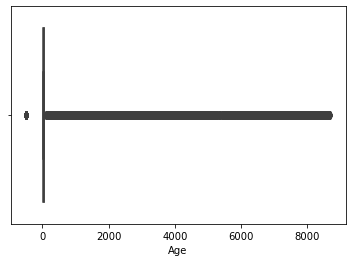

In [41]:
sns.boxplot(ctrain_data["Age"])

#### Using IQR method to replace all values outside the range with NaN

In [65]:
for x in num_cols:
    Q1 = np.percentile(ctrain_data.loc[:,x], 25)
    Q3 = np.percentile(ctrain_data.loc[:,x], 75)
    IQR = Q3 - Q1
    upper = Q3+1.5*IQR
    lower = Q1-1.5*IQR
    ctrain_data.loc[ctrain_data[x] < lower,x] = np.nan
    ctrain_data.loc[ctrain_data[x] > upper,x] = np.nan

In [72]:
ctrain_data.head(10)

,ID,Customer_ID,Month,Name,Age,SSN,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,0x1602,CUS_0xd40,January,Aaron Maashoh,23.0,821-00-0265,Scientist,19114.12,1824.843333,3.0,...,NaN,809.98,26.822620,22 Years and 1 Months,No,49.574949,80.415295,High_spent_Small_value_payments,312.494089,Good
1,0x1603,CUS_0xd40,February,Aaron Maashoh,23.0,821-00-0265,Scientist,19114.12,NaN,3.0,...,Good,809.98,31.944960,NaN,No,49.574949,118.280222,Low_spent_Large_value_payments,284.629162,Good
2,0x1604,CUS_0xd40,March,Aaron Maashoh,NaN,821-00-0265,Scientist,19114.12,NaN,3.0,...,Good,809.98,28.609352,22 Years and 3 Months,No,49.574949,81.699521,Low_spent_Medium_value_payments,331.209863,Good
3,0x1605,CUS_0xd40,April,Aaron Maashoh,23.0,821-00-0265,Scientist,19114.12,NaN,3.0,...,Good,809.98,31.377862,22 Years and 4 Months,No,49.574949,199.458074,Low_spent_Small_value_payments,223.451310,Good
4,0x1606,CUS_0xd40,May,Aaron Maashoh,23.0,821-00-0265,Scientist,19114.12,1824.843333,3.0,...,Good,809.98,24.797347,22 Years and 5 Months,No,49.574949,41.420153,High_spent_Medium_value_payments,341.489231,Good
5,0x1607,CUS_0xd40,June,Aaron Maashoh,23.0,821-00-0265,Scientist,19114.12,NaN,3.0,...,Good,809.98,27.262259,22 Years and 6 Months,No,49.574949,62.430172,NaN,340.479212,Good
6,0x1608,CUS_0xd40,July,Aaron Maashoh,23.0,821-00-0265,Scientist,19114.12,1824.843333,3.0,...,Good,809.98,22.537593,22 Years and 7 Months,No,49.574949,178.344067,Low_spent_Small_value_payments,244.565317,Good
7,0x1609,CUS_0xd40,August,NaN,23.0,NaN,Scientist,19114.12,1824.843333,3.0,...,Good,809.98,23.933795,NaN,No,49.574949,24.785217,High_spent_Medium_value_payments,358.124168,Standard
8,0x160e,CUS_0x21b1,January,Rick Rothackerj,28.0,004-07-5839,NaN,34847.84,3037.986667,2.0,...,Good,605.03,24.464031,26 Years and 7 Months,No,18.816215,104.291825,Low_spent_Small_value_payments,470.690627,Standard
9,0x160f,CUS_0x21b1,February,Rick Rothackerj,28.0,004-07-5839,Teacher,34847.84,3037.986667,2.0,...,Good,605.03,38.550848,26 Years and 8 Months,No,18.816215,40.391238,High_spent_Large_value_payments,484.591214,Good


#### Handling missing numerical values

In [67]:
ctrain_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 28 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   ID                        100000 non-null  object 
 1   Customer_ID               100000 non-null  object 
 2   Month                     100000 non-null  object 
 3   Name                      90015 non-null   object 
 4   Age                       97219 non-null   float64
 5   SSN                       94428 non-null   object 
 6   Occupation                92938 non-null   object 
 7   Annual_Income             97217 non-null   float64
 8   Monthly_Inhand_Salary     84998 non-null   float64
 9   Num_Bank_Accounts         98685 non-null   float64
 10  Num_Credit_Card           97729 non-null   float64
 11  Interest_Rate             97966 non-null   float64
 12  Num_of_Loan               95652 non-null   float64
 13  Type_of_Loan              88592 non-null   ob

In [78]:
missing = ctrain_data.isna().sum()

In [85]:
missing = missing[missing > 0]

In [86]:
missing

Name                         9985
Age                          2781
SSN                          5572
Occupation                   7062
Annual_Income                2783
Monthly_Inhand_Salary       15002
Num_Bank_Accounts            1315
Num_Credit_Card              2271
Interest_Rate                2034
Num_of_Loan                  4348
Type_of_Loan                11408
Delay_from_due_date          4002
Num_of_Delayed_Payment       7002
Changed_Credit_Limit         2091
Num_Credit_Inquiries         1965
Credit_Mix                  20195
Outstanding_Debt             5272
Credit_Utilization_Ratio        4
Credit_History_Age           9030
Total_EMI_per_month          6795
Amount_invested_monthly      4479
Payment_Behaviour            7600
Monthly_Balance              2868
dtype: int64

In [88]:
missing_cols = missing.index

In [99]:
missing_cols_set = set(missing_cols) # Since intersection is not available for lists, we use sets
missing_cols_set

{'Age',
 'Amount_invested_monthly',
 'Annual_Income',
 'Changed_Credit_Limit',
 'Credit_History_Age',
 'Credit_Mix',
 'Credit_Utilization_Ratio',
 'Delay_from_due_date',
 'Interest_Rate',
 'Monthly_Balance',
 'Monthly_Inhand_Salary',
 'Name',
 'Num_Bank_Accounts',
 'Num_Credit_Card',
 'Num_Credit_Inquiries',
 'Num_of_Delayed_Payment',
 'Num_of_Loan',
 'Occupation',
 'Outstanding_Debt',
 'Payment_Behaviour',
 'SSN',
 'Total_EMI_per_month',
 'Type_of_Loan'}

In [97]:
num_cols_set = set(num_cols)
num_cols_set

{'Age',
 'Amount_invested_monthly',
 'Annual_Income',
 'Changed_Credit_Limit',
 'Credit_Utilization_Ratio',
 'Delay_from_due_date',
 'Interest_Rate',
 'Monthly_Balance',
 'Monthly_Inhand_Salary',
 'Num_Bank_Accounts',
 'Num_Credit_Card',
 'Num_Credit_Inquiries',
 'Num_of_Delayed_Payment',
 'Num_of_Loan',
 'Outstanding_Debt',
 'Total_EMI_per_month'}

In [100]:
num_cols_missing = [col for col in num_cols_set.intersection(missing_cols_set)] 

In [101]:
num_cols_missing

['Annual_Income',
 'Monthly_Balance',
 'Credit_Utilization_Ratio',
 'Monthly_Inhand_Salary',
 'Changed_Credit_Limit',
 'Age',
 'Total_EMI_per_month',
 'Delay_from_due_date',
 'Interest_Rate',
 'Num_of_Delayed_Payment',
 'Num_Credit_Inquiries',
 'Amount_invested_monthly',
 'Num_of_Loan',
 'Num_Credit_Card',
 'Num_Bank_Accounts',
 'Outstanding_Debt']

In [102]:
ctrain_data[num_cols_missing]

,Annual_Income,Monthly_Balance,Credit_Utilization_Ratio,Monthly_Inhand_Salary,Changed_Credit_Limit,Age,Total_EMI_per_month,Delay_from_due_date,Interest_Rate,Num_of_Delayed_Payment,Num_Credit_Inquiries,Amount_invested_monthly,Num_of_Loan,Num_Credit_Card,Num_Bank_Accounts,Outstanding_Debt
0,19114.12,312.494089,26.822620,1824.843333,11.27,23.0,49.574949,3.0,3.0,7.0,4.0,80.415295,4.0,4.0,3.0,809.98
1,19114.12,284.629162,31.944960,NaN,11.27,23.0,49.574949,-1.0,3.0,NaN,4.0,118.280222,4.0,4.0,3.0,809.98
2,19114.12,331.209863,28.609352,NaN,NaN,NaN,49.574949,3.0,3.0,7.0,4.0,81.699521,4.0,4.0,3.0,809.98
3,19114.12,223.451310,31.377862,NaN,6.27,23.0,49.574949,5.0,3.0,4.0,4.0,199.458074,4.0,4.0,3.0,809.98
4,19114.12,341.489231,24.797347,1824.843333,11.27,23.0,49.574949,6.0,3.0,NaN,4.0,41.420153,4.0,4.0,3.0,809.98
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,39628.99,NaN,34.663572,3359.415833,11.50,25.0,35.104023,23.0,7.0,7.0,3.0,60.971333,2.0,6.0,4.0,502.38
99996,39628.99,NaN,40.565631,3359.415833,11.50,25.0,35.104023,18.0,7.0,7.0,3.0,54.185950,2.0,6.0,4.0,502.38
99997,39628.99,NaN,41.255522,3359.415833,11.50,25.0,35.104023,27.0,NaN,6.0,3.0,24.028477,2.0,6.0,4.0,502.38
99998,39628.99,NaN,33.638208,3359.415833,11.50,25.0,35.104023,20.0,7.0,NaN,3.0,251.672582,2.0,6.0,4.0,502.38


#### From the above dataframe it is clear that there are some columns which have same value till a particular row number (based on Customer ID). So we can group based on customer ID & then check which all columns have same values

#### Adding customer ID to the set

In [103]:
num_cols_missing.append('Customer_ID')

In [104]:
num_cols_missing

['Annual_Income',
 'Monthly_Balance',
 'Credit_Utilization_Ratio',
 'Monthly_Inhand_Salary',
 'Changed_Credit_Limit',
 'Age',
 'Total_EMI_per_month',
 'Delay_from_due_date',
 'Interest_Rate',
 'Num_of_Delayed_Payment',
 'Num_Credit_Inquiries',
 'Amount_invested_monthly',
 'Num_of_Loan',
 'Num_Credit_Card',
 'Num_Bank_Accounts',
 'Outstanding_Debt',
 'Customer_ID']

In [105]:
ctrain_data[num_cols_missing]

,Annual_Income,Monthly_Balance,Credit_Utilization_Ratio,Monthly_Inhand_Salary,Changed_Credit_Limit,Age,Total_EMI_per_month,Delay_from_due_date,Interest_Rate,Num_of_Delayed_Payment,Num_Credit_Inquiries,Amount_invested_monthly,Num_of_Loan,Num_Credit_Card,Num_Bank_Accounts,Outstanding_Debt,Customer_ID
0,19114.12,312.494089,26.822620,1824.843333,11.27,23.0,49.574949,3.0,3.0,7.0,4.0,80.415295,4.0,4.0,3.0,809.98,CUS_0xd40
1,19114.12,284.629162,31.944960,NaN,11.27,23.0,49.574949,-1.0,3.0,NaN,4.0,118.280222,4.0,4.0,3.0,809.98,CUS_0xd40
2,19114.12,331.209863,28.609352,NaN,NaN,NaN,49.574949,3.0,3.0,7.0,4.0,81.699521,4.0,4.0,3.0,809.98,CUS_0xd40
3,19114.12,223.451310,31.377862,NaN,6.27,23.0,49.574949,5.0,3.0,4.0,4.0,199.458074,4.0,4.0,3.0,809.98,CUS_0xd40
4,19114.12,341.489231,24.797347,1824.843333,11.27,23.0,49.574949,6.0,3.0,NaN,4.0,41.420153,4.0,4.0,3.0,809.98,CUS_0xd40
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,39628.99,NaN,34.663572,3359.415833,11.50,25.0,35.104023,23.0,7.0,7.0,3.0,60.971333,2.0,6.0,4.0,502.38,CUS_0x942c
99996,39628.99,NaN,40.565631,3359.415833,11.50,25.0,35.104023,18.0,7.0,7.0,3.0,54.185950,2.0,6.0,4.0,502.38,CUS_0x942c
99997,39628.99,NaN,41.255522,3359.415833,11.50,25.0,35.104023,27.0,NaN,6.0,3.0,24.028477,2.0,6.0,4.0,502.38,CUS_0x942c
99998,39628.99,NaN,33.638208,3359.415833,11.50,25.0,35.104023,20.0,7.0,NaN,3.0,251.672582,2.0,6.0,4.0,502.38,CUS_0x942c


In [106]:
based_customer_ID = [col for col in num_cols if ctrain_data[col].head(8).nunique() == 1]
non_based_customer_ID = [col for col in num_cols if ctrain_data[col].head(8).nunique() != 1]
# First 8 rows have the same customer ID

In [107]:
based_customer_ID

['Age',
 'Annual_Income',
 'Monthly_Inhand_Salary',
 'Num_Bank_Accounts',
 'Num_Credit_Card',
 'Interest_Rate',
 'Num_of_Loan',
 'Num_Credit_Inquiries',
 'Outstanding_Debt',
 'Total_EMI_per_month']

In [108]:
non_based_customer_ID

['Delay_from_due_date',
 'Num_of_Delayed_Payment',
 'Changed_Credit_Limit',
 'Credit_Utilization_Ratio',
 'Amount_invested_monthly',
 'Monthly_Balance']

In [114]:
ctrain_data[based_customer_ID] = ctrain_data.groupby(['Customer_ID'])[based_customer_ID].transform('median')
ctrain_data[non_based_customer_ID] = ctrain_data[non_based_customer_ID].fillna(method='bfill')

In [115]:
ctrain_data[based_customer_ID] 

,Age,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,Num_of_Loan,Num_Credit_Inquiries,Outstanding_Debt,Total_EMI_per_month
0,23.0,19114.12,1824.843333,3.0,4.0,3.0,4.0,4.0,809.98,49.574949
1,23.0,19114.12,1824.843333,3.0,4.0,3.0,4.0,4.0,809.98,49.574949
2,23.0,19114.12,1824.843333,3.0,4.0,3.0,4.0,4.0,809.98,49.574949
3,23.0,19114.12,1824.843333,3.0,4.0,3.0,4.0,4.0,809.98,49.574949
4,23.0,19114.12,1824.843333,3.0,4.0,3.0,4.0,4.0,809.98,49.574949
...,...,...,...,...,...,...,...,...,...,...
99995,25.0,39628.99,3359.415833,4.0,6.0,7.0,2.0,3.0,502.38,35.104023
99996,25.0,39628.99,3359.415833,4.0,6.0,7.0,2.0,3.0,502.38,35.104023
99997,25.0,39628.99,3359.415833,4.0,6.0,7.0,2.0,3.0,502.38,35.104023
99998,25.0,39628.99,3359.415833,4.0,6.0,7.0,2.0,3.0,502.38,35.104023


In [116]:
ctrain_data[non_based_customer_ID]

,Delay_from_due_date,Num_of_Delayed_Payment,Changed_Credit_Limit,Credit_Utilization_Ratio,Amount_invested_monthly,Monthly_Balance
0,3.0,7.0,11.27,26.822620,80.415295,312.494089
1,-1.0,7.0,11.27,31.944960,118.280222,284.629162
2,3.0,7.0,6.27,28.609352,81.699521,331.209863
3,5.0,4.0,6.27,31.377862,199.458074,223.451310
4,6.0,4.0,11.27,24.797347,41.420153,341.489231
...,...,...,...,...,...,...
99995,23.0,7.0,11.50,34.663572,60.971333,NaN
99996,18.0,7.0,11.50,40.565631,54.185950,NaN
99997,27.0,6.0,11.50,41.255522,24.028477,NaN
99998,20.0,6.0,11.50,33.638208,251.672582,NaN


In [117]:
ctrain_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 28 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   ID                        100000 non-null  object 
 1   Customer_ID               100000 non-null  object 
 2   Month                     100000 non-null  object 
 3   Name                      90015 non-null   object 
 4   Age                       100000 non-null  float64
 5   SSN                       94428 non-null   object 
 6   Occupation                92938 non-null   object 
 7   Annual_Income             98200 non-null   float64
 8   Monthly_Inhand_Salary     100000 non-null  float64
 9   Num_Bank_Accounts         100000 non-null  float64
 10  Num_Credit_Card           100000 non-null  float64
 11  Interest_Rate             100000 non-null  float64
 12  Num_of_Loan               100000 non-null  float64
 13  Type_of_Loan              88592 non-null   ob

In [118]:
missing1 =ctrain_data.isna().sum()

In [119]:
missing1

ID                              0
Customer_ID                     0
Month                           0
Name                         9985
Age                             0
SSN                          5572
Occupation                   7062
Annual_Income                1800
Monthly_Inhand_Salary           0
Num_Bank_Accounts               0
Num_Credit_Card                 0
Interest_Rate                   0
Num_of_Loan                     0
Type_of_Loan                11408
Delay_from_due_date             0
Num_of_Delayed_Payment          0
Changed_Credit_Limit            0
Num_Credit_Inquiries            0
Credit_Mix                  20195
Outstanding_Debt             5272
Credit_Utilization_Ratio        0
Credit_History_Age           9030
Payment_of_Min_Amount           0
Total_EMI_per_month          2376
Amount_invested_monthly         0
Payment_Behaviour            7600
Monthly_Balance              1696
Credit_Score                    0
dtype: int64

In [120]:
missing1_cols = missing.index

In [121]:
missing1_cols_set = set(missing_cols) # Since intersection is not available for lists, we use sets
missing1_cols_set

{'Age',
 'Amount_invested_monthly',
 'Annual_Income',
 'Changed_Credit_Limit',
 'Credit_History_Age',
 'Credit_Mix',
 'Credit_Utilization_Ratio',
 'Delay_from_due_date',
 'Interest_Rate',
 'Monthly_Balance',
 'Monthly_Inhand_Salary',
 'Name',
 'Num_Bank_Accounts',
 'Num_Credit_Card',
 'Num_Credit_Inquiries',
 'Num_of_Delayed_Payment',
 'Num_of_Loan',
 'Occupation',
 'Outstanding_Debt',
 'Payment_Behaviour',
 'SSN',
 'Total_EMI_per_month',
 'Type_of_Loan'}

In [127]:
obj_cols_set = set(obj_cols)
obj_cols_set

{'Credit_History_Age',
 'Credit_Mix',
 'Credit_Score',
 'Customer_ID',
 'ID',
 'Month',
 'Name',
 'Occupation',
 'Payment_Behaviour',
 'Payment_of_Min_Amount',
 'SSN',
 'Type_of_Loan'}

In [128]:
obj_cols_missing = [col for col in obj_cols_set.intersection(missing1_cols_set)]
obj_cols_missing

['Type_of_Loan',
 'Credit_History_Age',
 'Payment_Behaviour',
 'Occupation',
 'Credit_Mix',
 'SSN',
 'Name']

In [129]:
ctrain_data[obj_cols_missing] = ctrain_data[obj_cols_missing].fillna(method='bfill')

In [130]:
ctrain_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 28 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   ID                        100000 non-null  object 
 1   Customer_ID               100000 non-null  object 
 2   Month                     100000 non-null  object 
 3   Name                      100000 non-null  object 
 4   Age                       100000 non-null  float64
 5   SSN                       100000 non-null  object 
 6   Occupation                100000 non-null  object 
 7   Annual_Income             98200 non-null   float64
 8   Monthly_Inhand_Salary     100000 non-null  float64
 9   Num_Bank_Accounts         100000 non-null  float64
 10  Num_Credit_Card           100000 non-null  float64
 11  Interest_Rate             100000 non-null  float64
 12  Num_of_Loan               100000 non-null  float64
 13  Type_of_Loan              100000 non-null  ob

In [131]:
ctrain_data.dropna(inplace=True)

In [132]:
ctrain_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 89616 entries, 0 to 98303
Data columns (total 28 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   ID                        89616 non-null  object 
 1   Customer_ID               89616 non-null  object 
 2   Month                     89616 non-null  object 
 3   Name                      89616 non-null  object 
 4   Age                       89616 non-null  float64
 5   SSN                       89616 non-null  object 
 6   Occupation                89616 non-null  object 
 7   Annual_Income             89616 non-null  float64
 8   Monthly_Inhand_Salary     89616 non-null  float64
 9   Num_Bank_Accounts         89616 non-null  float64
 10  Num_Credit_Card           89616 non-null  float64
 11  Interest_Rate             89616 non-null  float64
 12  Num_of_Loan               89616 non-null  float64
 13  Type_of_Loan              89616 non-null  object 
 14  Delay_

#### Dropping unwanted columns

In [133]:
ctrain_data.drop(columns = ['Name', 'SSN', 'Type_of_Loan'], inplace=True)

In [134]:
ctrain_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 89616 entries, 0 to 98303
Data columns (total 25 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   ID                        89616 non-null  object 
 1   Customer_ID               89616 non-null  object 
 2   Month                     89616 non-null  object 
 3   Age                       89616 non-null  float64
 4   Occupation                89616 non-null  object 
 5   Annual_Income             89616 non-null  float64
 6   Monthly_Inhand_Salary     89616 non-null  float64
 7   Num_Bank_Accounts         89616 non-null  float64
 8   Num_Credit_Card           89616 non-null  float64
 9   Interest_Rate             89616 non-null  float64
 10  Num_of_Loan               89616 non-null  float64
 11  Delay_from_due_date       89616 non-null  float64
 12  Num_of_Delayed_Payment    89616 non-null  float64
 13  Changed_Credit_Limit      89616 non-null  float64
 14  Num_Cr

In [135]:
ctrain_data['Credit_Score'] = ctrain_data['Credit_Score'].map({'Poor':1, 'Standard':2, 'Good':3})
ctrain_data['Month'] = ctrain_data['Month'].map({'January':1, 'February':2, 'March':3, 'April':4, 'May':5, 'June':6, 'July':7, 'August':8, 'September':9, 'October':10, 'November':11, 'December':12})

In [136]:
ctrain_data

,ID,Customer_ID,Month,Age,Occupation,Annual_Income,Monthly_Inhand_Salary,Num_Bank_Accounts,Num_Credit_Card,Interest_Rate,...,Credit_Mix,Outstanding_Debt,Credit_Utilization_Ratio,Credit_History_Age,Payment_of_Min_Amount,Total_EMI_per_month,Amount_invested_monthly,Payment_Behaviour,Monthly_Balance,Credit_Score
0,0x1602,CUS_0xd40,1,23.0,Scientist,19114.12,1824.843333,3.0,4.0,3.0,...,Good,809.98,26.822620,22 Years and 1 Months,No,49.574949,80.415295,High_spent_Small_value_payments,312.494089,3
1,0x1603,CUS_0xd40,2,23.0,Scientist,19114.12,1824.843333,3.0,4.0,3.0,...,Good,809.98,31.944960,22 Years and 3 Months,No,49.574949,118.280222,Low_spent_Large_value_payments,284.629162,3
2,0x1604,CUS_0xd40,3,23.0,Scientist,19114.12,1824.843333,3.0,4.0,3.0,...,Good,809.98,28.609352,22 Years and 3 Months,No,49.574949,81.699521,Low_spent_Medium_value_payments,331.209863,3
3,0x1605,CUS_0xd40,4,23.0,Scientist,19114.12,1824.843333,3.0,4.0,3.0,...,Good,809.98,31.377862,22 Years and 4 Months,No,49.574949,199.458074,Low_spent_Small_value_payments,223.451310,3
4,0x1606,CUS_0xd40,5,23.0,Scientist,19114.12,1824.843333,3.0,4.0,3.0,...,Good,809.98,24.797347,22 Years and 5 Months,No,49.574949,41.420153,High_spent_Medium_value_payments,341.489231,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
98299,0x255f9,CUS_0x9d41,4,38.0,Lawyer,41015.55,3152.962500,0.0,4.0,4.0,...,Good,599.40,31.936092,25 Years and 2 Months,NM,25.671257,387.541439,Low_spent_Small_value_payments,192.083554,2
98300,0x255fa,CUS_0x9d41,5,38.0,Lawyer,41015.55,3152.962500,0.0,4.0,4.0,...,Good,599.40,26.268474,25 Years and 3 Months,No,25.671257,76.057218,High_spent_Large_value_payments,453.567775,2
98301,0x255fb,CUS_0x9d41,6,38.0,Lawyer,41015.55,3152.962500,0.0,4.0,4.0,...,Good,599.40,28.754729,25 Years and 5 Months,No,25.671257,91.198586,High_spent_Medium_value_payments,448.426407,2
98302,0x255fc,CUS_0x9d41,7,38.0,Lawyer,41015.55,3152.962500,0.0,4.0,4.0,...,Good,599.40,38.514974,25 Years and 5 Months,No,25.671257,205.830993,High_spent_Small_value_payments,343.794000,2


C:\Users\HP\anaconda3\lib\site-packages\seaborn\_decorators.py:36: FutureWarning: Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  warnings.warn(


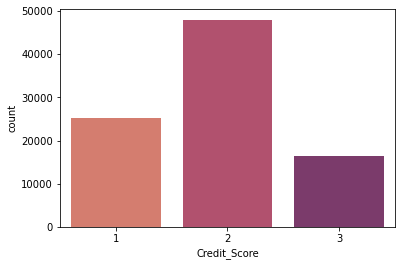

In [142]:
sns.countplot(ctrain_data['Credit_Score'], palette="flare");
plt.show()

In [143]:
ctrain_data['Credit_Score'].value_counts()

2    47976
1    25279
3    16361
Name: Credit_Score, dtype: int64

In [145]:
import plotly.express as px

In [155]:
fig = px.box(ctrain_data, 
             x="Occupation",  
             color="Credit_Score", 
             title="Credit Score Based on Occupation",
             color_discrete_map={'Poor':'red',
                                 'Standard':'yellow',
                                 'Good':'green'})
fig.show()

## Credit score distibution for diff occupations are almost the same

Text(0.5, 1.0, 'Credit Score based on Annual Income')

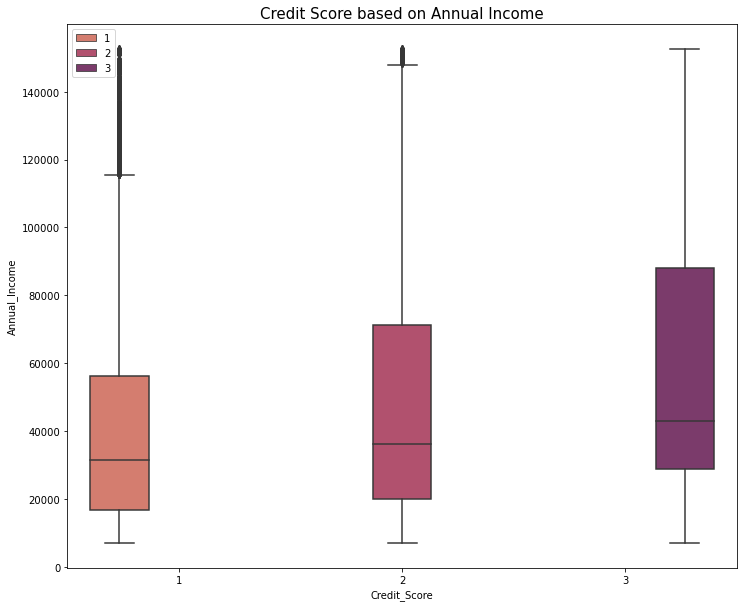

In [198]:
plt.figure(figsize = (12,10))
fig = sns.boxplot(data = ctrain_data, x="Credit_Score", y="Annual_Income", hue="Credit_Score", palette = "flare")
plt.legend(loc='upper left')
plt.title("Credit Score based on Annual Income", fontsize = 15)
## higher the annual income/monthly inhand salary, better the credit score

In [195]:
fig = px.box(ctrain_data, 
             x="Credit_Score", 
             y="Num_Bank_Accounts", 
             color="Credit_Score",
             title="Credit Score based on Number of Bank Accounts", 
             color_discrete_map={'Poor':'red',
                                 'Standard':'yellow',
                                 'Good':'green'})
fig.show()
## Having more number of bank accounts & credit cards affect your credit score

In [201]:
fig = px.box(ctrain_data, 
             x="Credit_Score", 
             y="Total_EMI_per_month", 
             color="Credit_Score", 
             title="Credit Scores based on Total Number of EMIs per Month",
             color_discrete_map={'Poor':'red',
                                 'Standard':'yellow',
                                 'Good':'green'})
fig.show()

## No:of EMIs per month doesn't have much effect on Credit Score

In [207]:
fig = px.box(ctrain_data, 
             x="Credit_Score", 
             y="Delay_from_due_date", 
             color="Credit_Score", 
             title="Credit Score based on Monthly Balance",
             color_discrete_map={'Poor':'red',
                                 'Standard':'yellow',
                                 'Good':'green'})
fig.show()
## Delaying the payments for 5-14 days won't affect your credit score